This notebooks produces some plots associated with the paper produced with this repository. It creates the optimization plots related to the Bicing expansion in l'Eixample.

---
Author: Jordi Grau Escolano


# 1. Load data

In [1]:
import os, sys
import numpy as np
from pathlib import Path
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import contextily as ctx
import seaborn as sns

# Add project root to path
project_root = Path().resolve().parents[0]
sys.path.insert(0, str(project_root))
ROOT = "../"

from paths import *
import src.data_loader as dl
import src.optimization.experiments.helper_experiment as he
import src.optimization.helper_optimization as ho
import src.results_exploration.helper_visualizations as hv
import src.assign_to_nodes.utils.load_input_datasets as lid 

RESULTS_DIR = f'{ROOT}/{VISUALIZATIONS}/BSS_ampliation'
os.makedirs(RESULTS_DIR, exist_ok=True)

# Load the data
df, G, distance_matrix, id_to_idx, idx_to_id, _, STATION_MIN_DISTANCE = he.load_data(root=ROOT)
df_stations = pd.read_csv(f'{ROOT}/{PR_EXP}/BSS_ampliation/bicing_stations_no_eixample_reassigned.csv')
df_stations['geometry'] = df_stations['geometry'].apply(wkt.loads)
df_stations = gpd.GeoDataFrame(df_stations, geometry=df_stations['geometry'], crs='EPSG:25831')
required_nodes = df_stations['final_node_id'].values
city_boundary = dl.load_bcn_boundary()

# Define scenarios
weights_dict = {
    "s1": {"population": 0.4, "pois_total": 0.35, "pois_entropy": 0.25},
    "s2": {"bus_lines": 0.2, "metro_lines": 0.2, "tram_lines": 0.1, "pois_total": 0.4, "bike_lane_kms": 0.1},
    "s3": {"income_2022_pers": 0.4, "unemployment": 0.3, "education_primary": 0.3}
}

# Check scenario weights sum to 1
for s in weights_dict:
    print(f"scenario={s} -> {sum(weights_dict[s].values())}")

# Compute normalized scores
df_weights = pd.DataFrame()
for s in weights_dict:
    if df_weights.empty:
        df_weights = ho.sum_and_normalize_all_node_scores(df, weights_dict[s])
        df_weights.rename(columns={'norm_score': s}, inplace=True)
    else:
        df_weights[s] = ho.sum_and_normalize_all_node_scores(df, weights_dict[s])['norm_score']

df_weights.head(2)


	Successfully loaded graph bike_graph with protocol 5
Loading existing node attributes from ..//data/processed/nodes/node_attributes.csv
Loading pre-computed distance matrix and mappings...
	Successfully loaded mappings with protocol 5
Successfully loaded distance matrix of shape (18721, 18721)
scenario=s1 -> 1.0
scenario=s2 -> 1.0
scenario=s3 -> 1.0


,income_2022_pers,household_avg_m2,altitude,has_bike_lane,bike_lane_kms,n_health_care,n_culture,n_tourism,n_recreation,n_sport,...,motos_abs,cars_abs,others_abs,non_spanish_population,unemployment_percentage,geometry,score,s1,s2,s3
node_id,,,,,,,,,,,,,,,,,,,,,
21638831,0.64,0.68,2.09,0,0.0,0.0,0.14,0.22,0.12,0.0,...,0.0,0.0,3.22,0.04,0.67,POINT (431665.633 4579427.183),0.1925,0.240175,0.147952,0.277778
1259351831,0.66,0.71,2.68,0,0.0,0.0,0.00,0.00,0.00,0.0,...,0.0,0.0,0.00,0.00,0.68,POINT (431577.21 4579241.901),0.0790,0.098565,0.100396,0.256667


In [2]:
df_results = pd.read_csv(f'{ROOT}/{PR_EXP}/BSS_ampliation/alpha_screening.csv')
df_results['best_solution'] = df_results['best_solution'].apply(lambda x: eval(x))
df_results['weights'] = df_results['weights'].apply(lambda x: {k.split(': ')[0]: float(k.split(': ')[1]) for k in eval(x)})
df_results = df_results[df_results['N_stations'] == 518]
df_results.drop([
    'experiment_idx', 'N_stations', 'minutes_to_complete', 'generations',
    'score_combination', 'penalty_power'], axis=1, inplace=True)

# Bike lanes
df_bike_lanes = lid.load_bike_lanes(root=ROOT)
df_socioeconomic_neighborhood = lid.load_socioeconomic_neighborhood(root=ROOT)
df_socioeconomic_cs = lid.load_socioeconomic_census_section(root=ROOT)

# Load the neighborhoods and districts
df_neighborhoods = dl.load_bcn_neighborhoods(root=ROOT)
df_districts = dl.load_bcn_districts(root=ROOT)

# Load the POIs
df_pois = pd.read_csv(f'{ROOT}/{PR_INPUT}/urbanism_pois.csv')
# df_pois.drop(columns=['element', 'osmid'], inplace=True)
df_pois['geometry'] = df_pois['geometry'].apply(wkt.loads)
df_pois = gpd.GeoDataFrame(df_pois, geometry='geometry', crs='EPSG:25831')

# 2. Check stations in the district

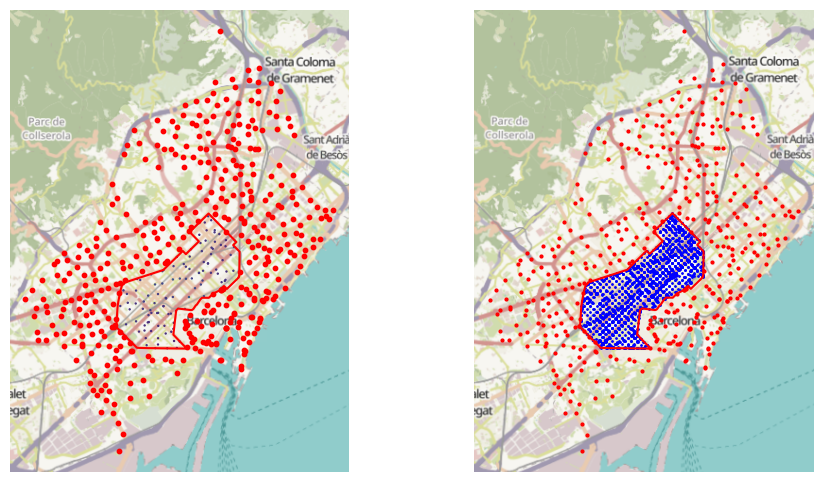

In [3]:
# Find nodes that are inside the eixample geometry
nodes_inside = df[df.geometry.within(df_districts[
    df_districts['district'] == 'Eixample'].geometry.values[0])]

# Filter out stations that come from the required nodes
optimized_stations = df_weights[df_weights.index.isin(df_results['best_solution'].values[0])]
optimized_stations = optimized_stations[~optimized_stations.index.isin(df_stations['final_node_id'])]


# Plot stations
fig, axs = plt.subplots(1,2, figsize=(11, 6))
scenario = 's1'

## subplot 1
# Plot the required nodes
df_stations.plot(ax=axs[0], color='red', markersize=10)

# Plot the optimized stations
hv.plot_nodes_on_map(optimized_stations, scenario.lower(), axs[0], None, 
                        show_colorbar=False, show_norm_raw_vals=False, ctx_background=False)

# Plot the district and add the basemap
df_districts[df_districts['district'] == 'Eixample'].boundary.plot(ax=axs[0], color='red', markersize=5)
ctx.add_basemap(axs[0], crs=city_boundary.crs, zoom=12, attribution=False)
axs[0].axis('off')

## Subplot 2
# Plot the district
nodes_inside.plot(ax=axs[1], color='blue', markersize=1)

df[df['node_id'].isin(df_stations['final_node_id'].values)].plot(ax=axs[1], color='red', markersize=4)
df_districts[df_districts['district'] == 'Eixample'].boundary.plot(ax=axs[1], color='red', markersize=5)
ctx.add_basemap(axs[1], crs=city_boundary.crs, zoom=12, attribution=False)
axs[1].axis('off')
plt.show()


In [4]:
allowed_nodes = nodes_inside['node_id'].values
allowed_nodes = [node for node in allowed_nodes if node not in required_nodes] 

print(f"Number of required nodes: {len(required_nodes)}")
if 7687884821 in required_nodes:
    print('7687884821 is in required_nodes')
if 9700838789 in required_nodes:
    print('9700838789 is in required_nodes') 
if 7687884821 not in required_nodes and 9700838789 not in required_nodes:
    print('Neither node is in required_nodes')

print(f"Number of allowed nodes: {len(allowed_nodes)}")

if 7687884821 in allowed_nodes:
    print('7687884821 is in allowed_nodes')
if 9700838789 in allowed_nodes:
    print('9700838789 is in allowed_nodes')
if 7687884821 not in allowed_nodes and 9700838789 not in allowed_nodes:
    print('Neither node is in allowed_nodes')

    

Number of required nodes: 410
7687884821 is in required_nodes
Number of allowed nodes: 2180
9700838789 is in allowed_nodes


# 3. Optimized stations visualizations

## 3.1. Plot all amenities and mobility infrastructure that there is in Eixample

In [5]:
# Infrastructure
infrastructure_files = {
    'df_bus': 'infrastructure_bus_stops_lines.csv',
    'df_tram': 'infrastructure_tram_entrances_lines.csv', 
    'df_metro': 'infrastructure_metro_entrances_stops_lines.csv'
}

pt_dfs = {}

for df_name, filename in infrastructure_files.items():
    # Read CSV
    df = pd.read_csv(f'{ROOT}/{PR_INPUT}/{filename}')
    
    # Create geometry column
    df['geometry'] = df.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    
    # Convert to GeoDataFrame and reproject
    df = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')
    df.to_crs(city_boundary.crs, inplace=True)
    
    # Assign to variable name
    pt_dfs[df_name] = df

# Unpack
df_bus = pt_dfs['df_bus']
df_tram = pt_dfs['df_tram']
df_metro = pt_dfs['df_metro']

In [ ]:
def plot_pois_on_map(df_pois, ax, markersize=3):
    """
    Plot POIs on a map.
    """
    # Define colors for each category
    category_colors = {
            'health_care': 'red',
            'culture': 'blue',
            'tourism': 'green',
            'recreation': 'purple',
            'sport': 'orange',
            'economic_retail': 'brown',
            'industrial': 'gray',
            'green': 'lime',
            'civic': 'cyan',
            'worship': 'magenta',
            'education': 'yellow'
    }

    # Plot each category and store handles for legend
    legend_elements = []
    for category in category_colors.keys():
        if category in df_pois.columns:
            mask = df_pois[category] == 1
            if mask.any():
                # Plot points directly, convert polygons/lines to centroids
                points_mask = df_pois.loc[mask, 'geometry'].type == 'Point'
                other_mask = ~points_mask
                
                # Plot points
                if points_mask.any():
                    df_pois.loc[mask & points_mask, 'geometry'].plot(
                        ax=ax,
                        markersize=markersize,
                        label=category,
                        color=category_colors[category],
                        alpha=0.7
                    )
                
                # Plot centroids for non-points
                if other_mask.any():
                    df_pois.loc[mask & other_mask, 'geometry'].plot(
                        ax=ax,
                        markersize=markersize,
                        label=category,
                        color=category_colors[category],
                        alpha=0.7
                    )
        # Add to legend elements
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', alpha=0.7,
                                    markerfacecolor=category_colors[category],
                                    label=f"{category.replace('_', ' ').title()} POIs",
                                    markersize=8))

    return legend_elements

def plot_bike_lanes_on_map(df_bike_lanes, ax, markersize=3):
    """
    Plot bike lanes on a map.
    """
    df_bike_lanes.plot(ax=ax, color='black', markersize=markersize, alpha=0.5)

    legend_elements = [plt.Line2D([0], [0], color='black', linewidth=2, alpha=0.5, label='Bike lanes')]
    return legend_elements

def plot_rectangle(ax, node_ids, nodes_gdf, text=1, extra_distance=300):
    """Plot a rectangle encompassing all given nodes plus a buffer.
    
    Args:
        ax: matplotlib axis
        node_ids: List of node IDs to encompass in rectangle
        nodes_gdf: GeoDataFrame containing node geometries
        text: text to display in top right corner (default: 1)
    """
    # Get node coordinates in EPSG:25831
    nodes = nodes_gdf[nodes_gdf.index.isin(node_ids)]
    
    # Get min/max coordinates of all nodes
    min_x = nodes.geometry.x.min()
    max_x = nodes.geometry.x.max() 
    min_y = nodes.geometry.y.min()
    max_y = nodes.geometry.y.max()
    
    # Add 300m buffer in each direction
    x1_t = min_x - extra_distance
    x2_t = max_x + extra_distance
    y1_t = min_y - extra_distance
    y2_t = max_y + extra_distance
    
    # Calculate rectangle dimensions
    rect_width = x2_t - x1_t
    rect_height = y2_t - y1_t
    
    # Add rectangle patch
    ax.add_patch(Rectangle((x1_t, y1_t), rect_width, rect_height,
                          fill=False, edgecolor='black', 
                          linewidth=1, linestyle=':'))
    
    # Add text in top left corner
    ax.text(x1_t+40, y2_t-40, str(text),
            horizontalalignment='left', 
            verticalalignment='top',
            fontsize=8)

def plot_stations_pois_and_bike_lanes_in_rectangles(stations_gdf, node_ids, ax, text, df_pois=None, df_bus=None, df_tram=None, df_metro=None, df_bike_lanes=None, extra_distance=300):
    """Plots stations and POIs within a rectangle encompassing multiple nodes."""
    # Get nodes coordinates and calculate bounds
    nodes = stations_gdf[stations_gdf.index.isin(node_ids)]
    min_x, max_x = nodes.geometry.x.min(), nodes.geometry.x.max()
    min_y, max_y = nodes.geometry.y.min(), nodes.geometry.y.max()
    
    # Add buffer
    x1, x2 = min_x - extra_distance, max_x + extra_distance
    y1, y2 = min_y - extra_distance, max_y + extra_distance

    # Filter stations in rectangle
    stations_in_rect = stations_gdf[
        (stations_gdf.geometry.x.between(x1, x2)) & 
        (stations_gdf.geometry.y.between(y1, y2))
    ]

    # Filter other elements in rectangle
    dfs_in_rect = {}
    for df, name in zip([df_pois, df_bus, df_tram, df_metro, df_bike_lanes], ['pois', 'bus', 'tram', 'metro', 'bike_lanes']):
        if df is not None:
            if name == 'pois':
                buffer = stations_in_rect.geometry.union_all().buffer(300)
                filtered_pois = pd.concat([
                    df[df['element'] == elem][df[df['element'] == elem].geometry.intersects(buffer)]
                    for elem in ['node', 'way', 'relation']
                ])
                if not filtered_pois.empty:
                    dfs_in_rect[name] = filtered_pois
            elif name == 'bike_lanes':
                # For LineString geometries, use .bounds to filter by rectangle
                # .bounds returns (minx, miny, maxx, maxy) for each geometry
                # We'll keep bike lanes whose bounding box overlaps the rectangle
                bounds = df.geometry.bounds
                overlaps = (
                    (bounds['maxx'] >= x1) & (bounds['minx'] <= x2) &
                    (bounds['maxy'] >= y1) & (bounds['miny'] <= y2)
                )
                filtered_df = df[overlaps]
                if not filtered_df.empty:
                    dfs_in_rect[name] = filtered_df
            else:
                filtered_df = df[
                    (df.geometry.x.between(x1, x2)) & 
                    (df.geometry.y.between(y1, y2))
                ]
                if not filtered_df.empty:
                    dfs_in_rect[name] = filtered_df

    # Plot stations
    ax.scatter(stations_in_rect.geometry.x, stations_in_rect.geometry.y, color='gold', marker='*', s=200, alpha=1, edgecolor='black', linewidth=1)
    
    # Plot POIs and transport stops
    all_legend_elements_pois = []
    if df_pois is not None and 'pois' in dfs_in_rect and len(dfs_in_rect['pois']) > 0:
        legend_elements_pois = plot_pois_on_map(dfs_in_rect['pois'], ax)
        if legend_elements_pois:
            all_legend_elements_pois.extend(legend_elements_pois)

    for df_type, color in [('bus','red'), ('tram','green'), ('metro','blue')]:
        if df_type in dfs_in_rect:
            dfs_in_rect[df_type].plot(ax=ax, color=color, marker='^', markersize=50, edgecolor='black', linewidth=0.3)
    
    # Plot bike lanes using the plot_bike_lanes_on_map function
    legend_bike_lanes = []
    if df_bike_lanes is not None and 'bike_lanes' in dfs_in_rect and len(dfs_in_rect['bike_lanes']) > 0:
        legend_bike_lanes = plot_bike_lanes_on_map(dfs_in_rect['bike_lanes'], ax, markersize=3)

    # Set plot properties
    ax.set_xlim(x1, x2)
    ax.set_ylim(y1, y2)
    ax.axis('off')
    ax.text(x1-20, y2+10, f'{text}', fontsize=12, fontweight='bold')

    # Add transport legend elements
    legend_elements = [plt.scatter([], [], c=c, marker=m, s=60, edgecolor='black', linewidth=(1 if i == 0 else 0.3), label=l) 
                      for i, (c, m, l) in enumerate([('gold','*','BSS Station'), ('red','^','Bus'), ('green','^','Tram'), ('blue','^','Metro')])]
    legend_elements.extend(all_legend_elements_pois)
    legend_elements.extend(legend_bike_lanes)

    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=17, attribution=False)
    return legend_elements

In [7]:
def add_north_arrow(ax, size=0.05, location=(0.9, 0.15), linewidth=1, fontsize=12, color='k'):
    """
    Adds a north arrow to the given axes.
    """
    ax.annotate(
        '', 
        xy=(location[0], location[1]), 
        xytext=(location[0], location[1] - size),
        xycoords='axes fraction',
        textcoords='axes fraction',
        arrowprops=dict(facecolor=color, edgecolor=color, width=linewidth, headwidth=15, headlength=20),
        ha='center', va='center'
    )
    ax.text(location[0], location[1] - size - 0.018, 'N', transform=ax.transAxes,
            ha='center', va='center', fontsize=fontsize, fontweight='bold', color=color)
    

def add_scalebar(ax, length, location=(0.1, 0.05), linewidth=3, units='m', fontsize=14, color='k'):
    """
    Adds a scale bar to the map.
    """
    # Get axis limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    # Calculate start and end points in data coordinates
    x_start = xlim[0] + location[0] * (xlim[1] - xlim[0])
    y_start = ylim[0] + location[1] * (ylim[1] - ylim[0])
    x_end = x_start + length
    # Draw the scale bar
    ax.plot([x_start, x_end], [y_start, y_start], color=color, linewidth=linewidth, solid_capstyle='butt')
    # Add the label
    ax.text((x_start + x_end) / 2, y_start - 0.01 * (ylim[1] - ylim[0]), f'{int(length)} {units}',
            ha='center', va='top', fontsize=fontsize, color=color, fontweight='bold')

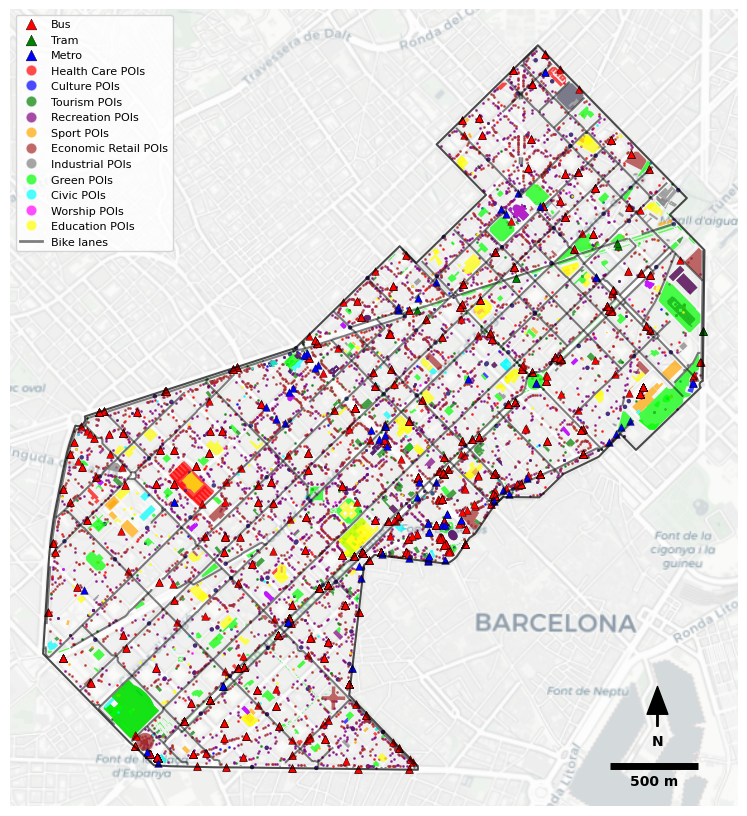

In [8]:
# Create figure with 1 large subplot on left and 4 small subplots on right
fig = plt.figure(figsize=(15, 13))

# Add large subplot on left
ax_main = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)
scenario = 's1'

# Plot the optimized stations
hv.plot_nodes_on_map(optimized_stations, scenario.lower(), ax_main, None, node_size=5,
                    show_colorbar=False, show_norm_raw_vals=False, ctx_background=False)

# Plot the bike lanes
df_bike_lanes_filt = df_bike_lanes[df_bike_lanes.within(df_districts[df_districts['district'] == 'Eixample'].geometry.union_all())]
legend_elements_bike_lanes = plot_bike_lanes_on_map(df_bike_lanes_filt, ax_main, markersize=3)


# Plot the POIs
df_pois_filt = df_pois[df_pois.within(df_districts[df_districts['district'] == 'Eixample'].geometry.union_all())]

legend_elements_pois = plot_pois_on_map(df_pois_filt, ax_main, markersize=1)

# Plot the district boundary
district_line = df_districts[df_districts['district'] == 'Eixample'].boundary.plot(
    ax=ax_main, color='black', markersize=3, alpha=0.7
)

dfs_in_rect = {
    'bus': df_bus,
    'tram': df_tram,
    'metro': df_metro
}

line_width = 0.3

for df_type, color in [('bus','red'), ('tram','green'), ('metro','blue')]:
        if df_type in dfs_in_rect:
            filtered_df = dfs_in_rect[df_type][
                    (dfs_in_rect[df_type].within(df_districts[df_districts['district'] == 'Eixample'].geometry.union_all()))
                ]
            if not filtered_df.empty:
                dfs_in_rect[df_type] = filtered_df
            dfs_in_rect[df_type].plot(ax=ax_main, color=color, marker='^', markersize=30, edgecolor='black', linewidth=line_width)

legend_elements = [plt.scatter([], [], c=c, marker=m, s=60, edgecolor='black', linewidth=line_width, label=l) for c,m,l in 
                      [('red','^','Bus'), ('green','^','Tram'), ('blue','^','Metro')]]
legend_elements.extend(legend_elements_pois)
legend_elements.extend(legend_elements_bike_lanes)

# Add basemap
ctx.add_basemap(ax_main, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=14, attribution=False)
ax_main.axis('off')

# Add legend
ax_main.legend(handles=legend_elements, loc='upper left', fontsize=8)

fontsize = 10
add_north_arrow(ax_main, size=0.05, location=(0.89, 0.15), linewidth=1, fontsize=fontsize)
add_scalebar(ax_main, length=500, location=(0.825, 0.05), linewidth=5, units='m', fontsize=fontsize, color='k')

plt.tight_layout()

# Save with minimal borders
plt.savefig(f'{RESULTS_DIR}/eixample_pois_and_pt.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.show()

## 3.2. Explore a few random nodes

{'population': 0.4, 'pois_total': 0.35, 'pois_entropy': 0.25}


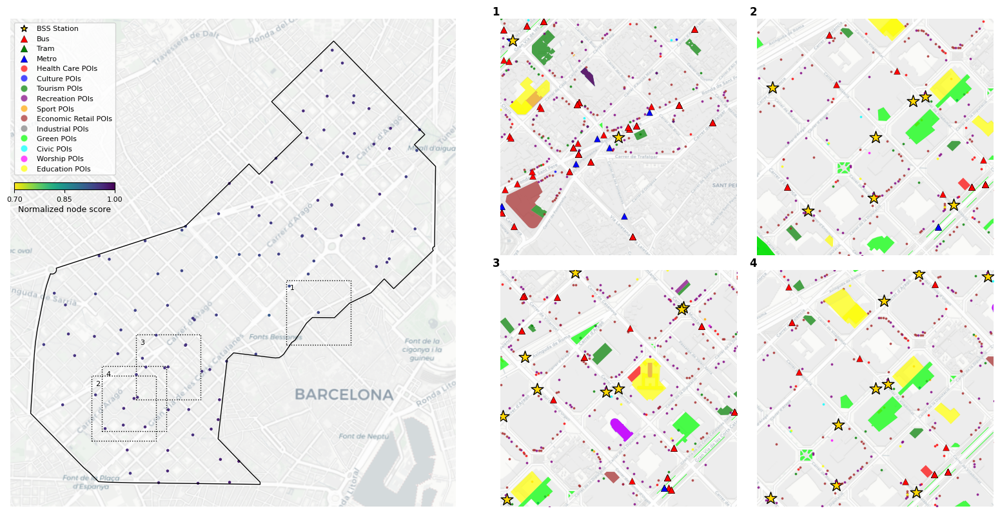

{'bus_lines': 0.2, 'metro_lines': 0.2, 'tram_lines': 0.1, 'pois_total': 0.4, 'bike_lane_kms': 0.1}


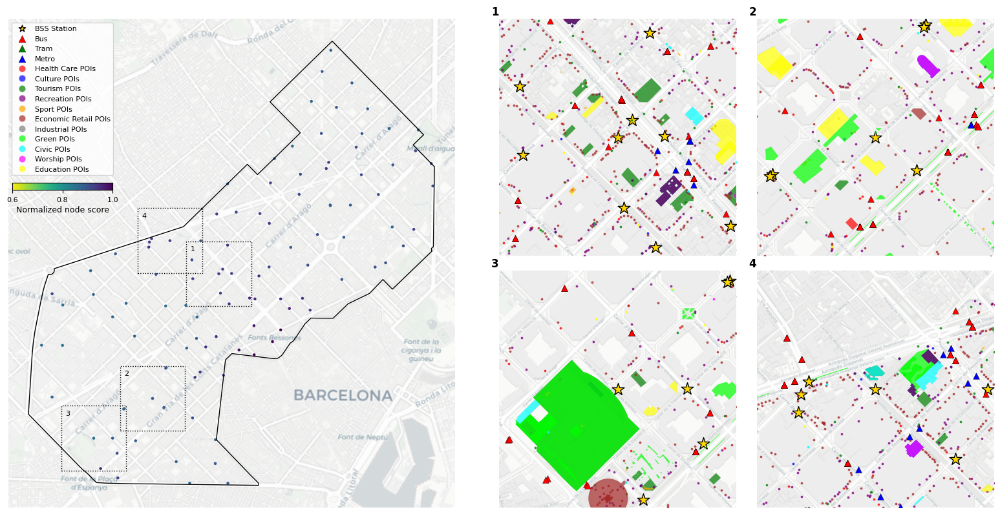

{'income_2022_pers': 0.4, 'unemployment': 0.3, 'education_primary': 0.3}


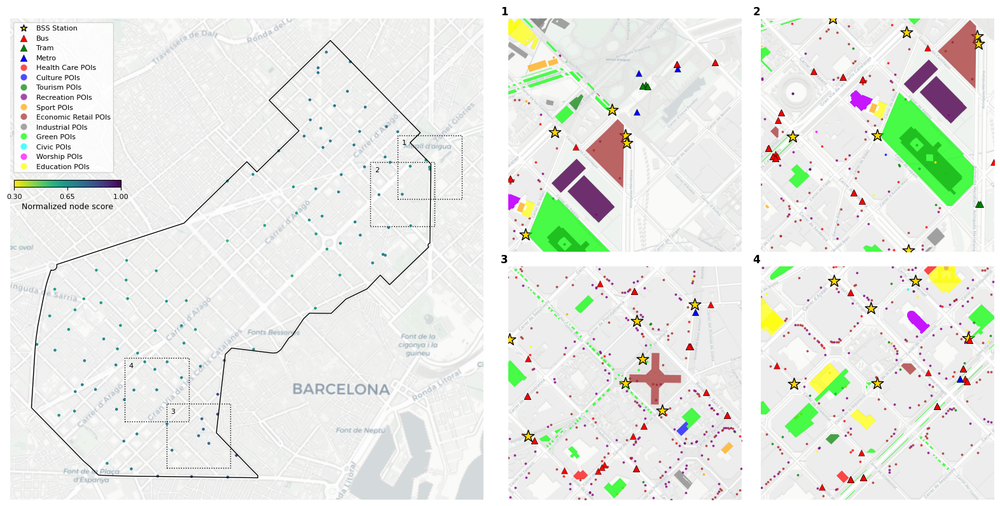

In [9]:
# Make a few random rectangles to explore the results
scenarios = ['s1', 's2', 's3']

for i,row in df_results.iterrows():
    print(row['weights'])

    chromosome = row['best_solution']


    # Filter out stations that come from the required nodes
    optimized_stations = df_weights[df_weights.index.isin(chromosome)]
    optimized_stations = optimized_stations[~optimized_stations.index.isin(df_stations['final_node_id'])]
    
    # Create figure with 1 large subplot on left and 4 small subplots on right
    fig = plt.figure(figsize=(16, 8))
    
    # Add large subplot on left
    ax_main = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)
    scenario = scenarios[i]


    # Select 4 random nodes from the chromosome and plot rectangles
    random_nodes = [[node] for node in np.random.choice(optimized_stations.index.to_list(), size=4, replace=False)]
    plot_rectangle(ax_main, random_nodes[0], df_weights, 1)
    plot_rectangle(ax_main, random_nodes[1], df_weights, 2) 
    plot_rectangle(ax_main, random_nodes[2], df_weights, 3)
    plot_rectangle(ax_main, random_nodes[3], df_weights, 4)

    # Plot the optimized stations
    vmin = np.floor(optimized_stations[scenario.lower()].min() * 10) / 10
    vmax = 1
    scatter = hv.plot_nodes_on_map(optimized_stations, scenario.lower(), ax_main, None, node_size=5,
                        show_colorbar=False, show_norm_raw_vals=False, ctx_background=False)

    # Plot the district and add the basemap
    df_districts[df_districts['district'] == 'Eixample'].boundary.plot(ax=ax_main, color='black', linewidth=1)
    ctx.add_basemap(ax_main, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=14, attribution=False)

    # Filter POIs to only include those within the district
    df_pois_filt = df_pois[df_pois.within(df_districts[df_districts['district'] == 'Eixample'].geometry.union_all())]

    # Add 4 smaller subplots on right
    for i in range(4):
        ax = plt.subplot2grid((2, 4), (i//2, i%2 + 2))        
        legend_elements = plot_stations_pois_and_bike_lanes_in_rectangles(
            optimized_stations, random_nodes[i], ax, i+1, df_pois=df_pois_filt, df_bus=df_bus, df_tram=df_tram, df_metro=df_metro)

    # Add legend
    ax_main.legend(handles=legend_elements, loc='upper left', fontsize=8)

    # Create a custom colormap with gray for zero values
    viridis_r = plt.get_cmap('viridis_r')
    colors = [(0.7, 0.7, 0.7, 1.0)]  # Start with gray
    colors.extend(viridis_r(np.linspace(0, 1, 255)))  # Add viridis_r colors
    custom_cmap = mpl.colors.ListedColormap(colors)

    # Create a ScalarMappable for the colorbar
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = ScalarMappable(norm=norm, cmap=custom_cmap)
    sm.set_array([])

    # Add colorbar in the bottom right corner of the main subplot
    cax = ax_main.inset_axes([0.009, 0.65, 0.225, 0.015])  # [x, y, width, height]
    cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', ticks=[round(vmin,2), round(vmax-(vmax-vmin)/2,2), round(vmax,2)])
    cbar.ax.set_title('Normalized node score', fontsize=9, pad=0, y=-3)
    cbar.ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

## 3.3. Explore nodes that are too close to the directed graph

In [83]:
def add_north_arrow(ax, size=0.05, location=(0.9, 0.15), linewidth=1, fontsize=12, color='k'):
    """
    Adds a north arrow to the given axes.
    """
    ax.annotate(
        '', 
        xy=(location[0], location[1]), 
        xytext=(location[0], location[1] - size),
        xycoords='axes fraction',
        textcoords='axes fraction',
        arrowprops=dict(facecolor=color, edgecolor=color, width=linewidth, headwidth=10, headlength=15),
        ha='center', va='center'
    )
    ax.text(location[0], location[1] - size - 0.018, 'N', transform=ax.transAxes,
            ha='center', va='center', fontsize=fontsize, fontweight='bold', color=color)
    

def add_scalebar(ax, length, location=(0.1, 0.05), linewidth=3, units='m', fontsize=14, color='k'):
    """
    Adds a scale bar to the map.
    The 'length' parameter should be in the same units as the map's CRS (usually meters for projected CRS).
    The 'location' parameter is in axes fraction (0-1, 0-1).
    """
    # Get axis limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    # Calculate the display length in data coordinates
    # Place the scalebar at the specified axes fraction
    x_start = xlim[0] + location[0] * (xlim[1] - xlim[0])
    y_start = ylim[0] + location[1] * (ylim[1] - ylim[0])
    x_end = x_start + length

    # Ensure the scalebar fits within the axis limits
    if x_end > xlim[1]:
        x_end = xlim[1]
        x_start = x_end - length

    # Draw the scale bar
    ax.plot([x_start, x_end], [y_start, y_start], color=color, linewidth=linewidth, solid_capstyle='butt', zorder=100)
    # Add the label above or below the scale bar
    ax.text((x_start + x_end) / 2, y_start - 0.01 * (ylim[1] - ylim[0]), f'{int(length)} {units}',
            ha='center', va='top', fontsize=fontsize, color=color, fontweight='bold', zorder=101,
            bbox=dict(facecolor='white', edgecolor='none', pad=0.5, alpha=0.7))


def plot_figure(chosen_nodes, df_results, df_stations, df_weights, df_pois, df_bus, df_tram, df_metro, df_bike_lanes, city_boundary, extra_distance=300):
    scenarios = ['s1', 's2', 's3']
    letters = ['A', 'B', 'C', 'D', 'E', 'F']

    for i, row in df_results[1:2].iterrows(): # only scenario S2
        print(row['weights'])

        chromosome = row['best_solution']

        # Filter out stations that come from the required nodes
        optimized_stations = df_weights[df_weights.index.isin(chromosome)]
        optimized_stations = optimized_stations[~optimized_stations.index.isin(df_stations['final_node_id'])]
        
        # Create figure with 1 large subplot on left and 4 small subplots on right
        fig = plt.figure(figsize=(16, 8))
        
        # Add large subplot on left
        ax_main = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)
        ax_main.text(-0.02, 1.03, f'{letters[0]}', fontsize=12, fontweight='bold', transform=ax_main.transAxes, ha='left', va='top')
        scenario = scenarios[i]

        # Plot rectangles on the main map for each list of chosen nodes
        for j, nodes in enumerate(chosen_nodes):
            print(letters[j+1], nodes)
            plot_rectangle(ax_main, nodes, df_weights, letters[j+1], extra_distance=extra_distance)

        # Plot the optimized stations
        vmin = np.floor(optimized_stations[scenario.lower()].min() * 10) / 10
        vmax = 1

        viridis_r = plt.get_cmap('viridis_r')
        optimized_stations.plot(ax=ax_main, column=scenario.lower(), markersize=20, marker='*', cmap=viridis_r, vmin=vmin, vmax=vmax)
        df_stations.plot(ax=ax_main, color='red', markersize=20, marker='*')  # Higher zorder to plot on top
        city_boundary.boundary.plot(ax=ax_main, color='black', linewidth=1, alpha=0.5)
        ax_main.axis('off')

        # Set sensible axis limits to avoid huge image sizes
        # Use the city boundary or district bounds, but buffer by a reasonable amount (e.g., 500m)
        try:
            bounds = df_districts[df_districts['district'] == 'Eixample'].geometry.buffer(500).total_bounds
            xmin, ymin, xmax, ymax = bounds
        except Exception:
            # fallback to city boundary
            xmin, ymin, xmax, ymax = city_boundary.total_bounds
        ax_main.set_xlim(xmin, xmax)
        ax_main.set_ylim(ymin, ymax)

        # Scale and north arrow to the left plot
        arrow_fontsize = 10
        add_north_arrow(ax_main, size=0.05, location=(0.92, 0.13), linewidth=1, fontsize=arrow_fontsize)
        # Add scalebar (500 meters, bottom right)
        add_scalebar(ax_main, length=500, location=(0.87, 0.04), linewidth=5, units='m', fontsize=arrow_fontsize, color='k')

        # Plot the district and add the basemap
        df_districts[df_districts['district'] == 'Eixample'].boundary.plot(ax=ax_main, color='black', linewidth=1)
        ctx.add_basemap(ax_main, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=14, attribution=False)

        # Filter POIs to only include those within the district
        df_pois_filt = df_pois[df_pois.within(df_districts[df_districts['district'] == 'Eixample'].geometry.union_all().buffer(200))]

        # Add 4 smaller subplots on right with more vertical spacing
        plt.subplots_adjust(hspace=0.4)  # Add vertical space between subplots
        for j in range(4):
            ax = plt.subplot2grid((2, 4), (j//2, j%2 + 2))
            legend_elements = plot_stations_pois_and_bike_lanes_in_rectangles(
                optimized_stations, chosen_nodes[j], ax, letters[j+1], df_pois=df_pois_filt, 
                df_bus=df_bus, df_tram=df_tram, df_metro=df_metro, df_bike_lanes=df_bike_lanes, extra_distance=extra_distance)
            
            if j == 0:
                small_arrow_fontsize = 8
                add_north_arrow(ax, size=0.1, location=(0.92, 0.21), linewidth=1, fontsize=small_arrow_fontsize)
                add_scalebar(ax, length=50, location=(0.86, 0.05), linewidth=5, units='m', fontsize=small_arrow_fontsize, color='k')

        # Add legend
        ax_main.legend(handles=legend_elements, loc='upper left', fontsize=8)

        # Create a custom colormap with gray for zero values
        viridis_r = plt.get_cmap('viridis_r')
        colors = [(0.7, 0.7, 0.7, 1.0)]  # Start with gray
        colors.extend(viridis_r(np.linspace(0, 1, 255)))  # Add viridis_r colors
        custom_cmap = mpl.colors.ListedColormap(colors)

        # Create a ScalarMappable for the colorbar
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        sm = ScalarMappable(norm=norm, cmap=custom_cmap)
        sm.set_array([])

        # Add colorbar in the bottom right corner of the main subplot
        cax = ax_main.inset_axes([0.009, 0.63, 0.22, 0.015])  # [x, y, width, height]
        cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', ticks=[round(vmin,2), round(vmax-(vmax-vmin)/2,2), round(vmax,2)])
        cbar.ax.set_title('Normalized node score ($U_i$)', fontsize=8, pad=0, y=-3)
        cbar.ax.tick_params(labelsize=8)

        plt.tight_layout()
        plt.show()

        return fig, ax_main

In [11]:
# Calculate distances between all pairs of stations using GeoPandas
# Set threshold distance in meters
X = 40  # You can adjust this value

# Create a copy of the stations GeoDataFrame
stations_gdf = optimized_stations.copy()

# Calculate pairwise distances using GeoPandas
close_pairs = []
for i, row1 in stations_gdf.iterrows():
    for j, row2 in stations_gdf.loc[stations_gdf.index > i].iterrows():
        distance = row1.geometry.distance(row2.geometry)
        if distance < X:
            close_pairs.append((i, j, distance))

# Print results            
print(f"Pairs of stations closer than {X}m:")
for pair in close_pairs:
    print(f"Stations {pair[0]} and {pair[1]}: {pair[2]:.1f}m apart")

Pairs of stations closer than 40m:
Stations 1482241341 and 4582895923: 22.1m apart
Stations 11287358665 and 11411140550: 20.6m apart


{'bus_lines': 0.2, 'metro_lines': 0.2, 'tram_lines': 0.1, 'pois_total': 0.4, 'bike_lane_kms': 0.1}
B [3184350968]
C [1379087659]
D [10177367824]
E [10177414030]


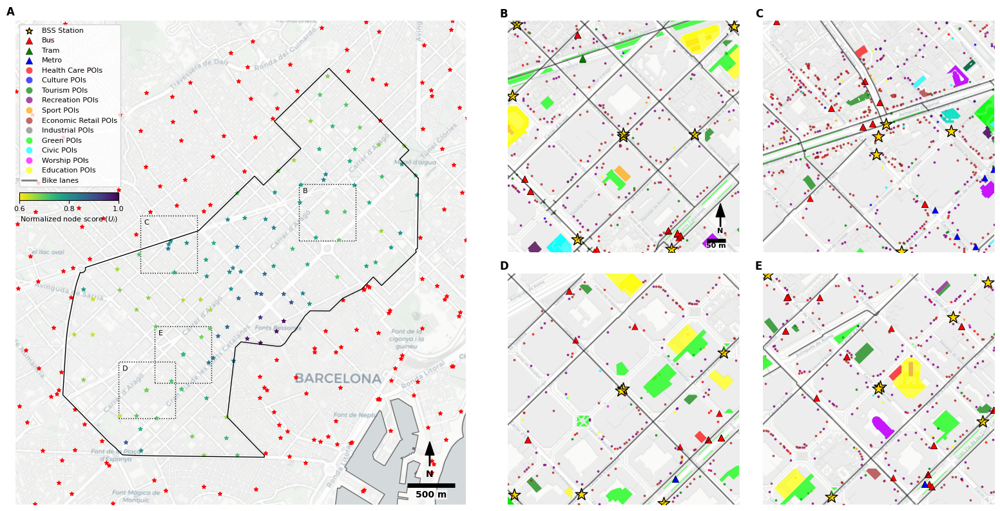

In [12]:
# Bad nodes
chosen_nodes = [[3184350968], [1379087659], [10177367824], [10177414030]]

fig = plot_figure(chosen_nodes, df_results, df_stations, df_weights, df_pois, df_bus, df_tram, df_metro, df_bike_lanes, city_boundary)

In [13]:
# Calculate distances between all pairs of stations
distance_threshold = 40
close_pairs = []
for i, row1 in optimized_stations.iterrows():
    for j, row2 in optimized_stations.loc[optimized_stations.index > i].iterrows():
        distance = row1.geometry.distance(row2.geometry)
        if distance < distance_threshold:
            close_pairs.append((i, j, distance))

# Print results            
print(f"Pairs of stations closer than {distance_threshold}m:")
for pair in close_pairs:
    print(f"Stations {pair[0]} and {pair[1]}: {pair[2]:.1f}m apart")

Pairs of stations closer than 40m:
Stations 1482241341 and 4582895923: 22.1m apart
Stations 11287358665 and 11411140550: 20.6m apart


In [14]:
all_stations = df_results[1:2]['best_solution'].values[0]
optimized_stations = df_weights[df_weights.index.isin(all_stations)]
optimized_stations = optimized_stations[~optimized_stations.index.isin(df_stations['final_node_id'])]
a = optimized_stations[['bus_lines', 'tram_lines', 'metro_lines', 'pois_total', 's2']]
a.sort_values('pois_total', ascending=False).head(10)

,bus_lines,tram_lines,metro_lines,pois_total,s2
node_id,,,,,
1400465768,0.96,0.0,0.96,0.87,0.989432
104461036,0.97,0.0,0.96,0.86,0.996037
1485622310,0.66,0.0,0.44,0.85,0.804491
9141342624,0.66,0.0,0.56,0.85,0.836196
1379087659,0.66,0.0,0.44,0.85,0.805812
8935152074,0.75,0.0,0.00,0.84,0.708058
2929997863,0.96,0.0,0.88,0.83,0.970938
9803583623,0.66,0.0,0.56,0.83,0.809775
1400465774,0.99,0.0,1.00,0.82,1.000000


## 3.4. Final visualization

{'bus_lines': 0.2, 'metro_lines': 0.2, 'tram_lines': 0.1, 'pois_total': 0.4, 'bike_lane_kms': 0.1}
B [2464729474]
C [1400465774, 1400465768]
D [12125059228]
E [9141342624]


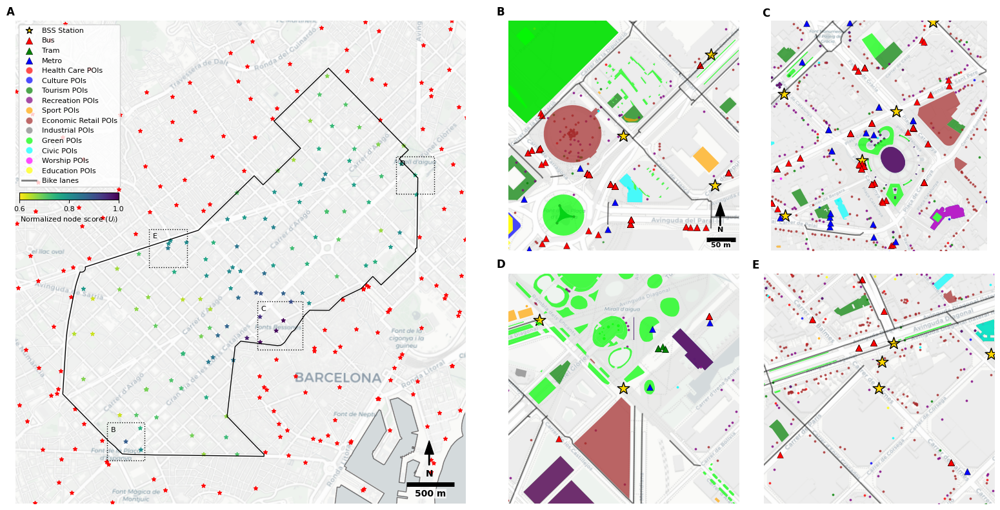

In [15]:
# Good nodes
cat = 1400465774
univ = 104461036
univ2 = 2929997863
cat2 = 1400465768
glories_tram = 12125059228
estacio_del_nord_bus = 1482241217
placa_espanya = 2464729474
rmbla_gran_via = 12309522700
nodes_super_junts = 10177367824
diagonal_3_estacions = 9141342624


chosen_nodes = [[placa_espanya], [cat, cat2], [glories_tram], [diagonal_3_estacions]]

fig, ax_main = plot_figure(chosen_nodes, df_results, df_stations, df_weights, df_pois, df_bus, df_tram, df_metro, df_bike_lanes, city_boundary, extra_distance=200)

fig.savefig(f'{RESULTS_DIR}/Bicing_ampliation_good_nodes.png')

## 3.4. Compare stats of the stations inside each square

CHOSEN NODES: [2464729474]


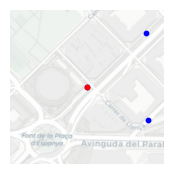

ALL NODES OF RECTANGLE: [2464729474, 431488440, 2464729474, 11020963044]
s2: 0.81 ± 0.07
bus_lines: 0.93 ± 0.10
metro_lines: 0.46 ± 0.19
tram_lines: 0.00 ± 0.00
pois_total: 0.73 ± 0.01
bike_lane_kms: 0.46 ± 0.05
----------------------------------------------------------------------------------------------------
CHOSEN NODES: [1400465774 1400465768]


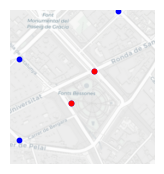

ALL NODES OF RECTANGLE: [1400465774, 1400465768, 104461036, 1400465774, 11466476299, 12309522700, 1400465768]
s2: 0.97 ± 0.04
bus_lines: 0.97 ± 0.01
metro_lines: 0.88 ± 0.14
tram_lines: 0.00 ± 0.00
pois_total: 0.82 ± 0.04
bike_lane_kms: 0.32 ± 0.14
----------------------------------------------------------------------------------------------------
CHOSEN NODES: [12125059228]


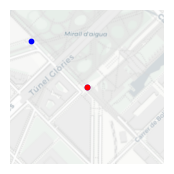

ALL NODES OF RECTANGLE: [12125059228, 12125059228, 11225278452]
s2: 0.76 ± 0.02
bus_lines: 0.56 ± 0.04
metro_lines: 0.28 ± 0.00
tram_lines: 1.00 ± 0.00
pois_total: 0.68 ± 0.01
bike_lane_kms: 0.40 ± 0.07
----------------------------------------------------------------------------------------------------
CHOSEN NODES: [9141342624]


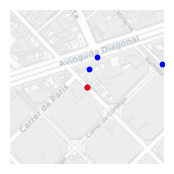

ALL NODES OF RECTANGLE: [9141342624, 9141342624, 9803583623, 1485622310, 1379087659]
s2: 0.81 ± 0.01
bus_lines: 0.66 ± 0.00
metro_lines: 0.50 ± 0.07
tram_lines: 0.00 ± 0.00
pois_total: 0.84 ± 0.01
bike_lane_kms: 0.46 ± 0.06
----------------------------------------------------------------------------------------------------


In [77]:
chosen_nodes = [[placa_espanya], [cat, cat2], [glories_tram], [diagonal_3_estacions]]
extra_distance = 200

for nodes in chosen_nodes:
    df_chosen_nodes = df_weights[df_weights.index.isin(nodes)]
    print("CHOSEN NODES:", df_chosen_nodes.index.values)

    # Get nodes coordinates and calculate bounds
    min_x, max_x = df_chosen_nodes.geometry.x.min(), df_chosen_nodes.geometry.x.max()
    min_y, max_y = df_chosen_nodes.geometry.y.min(), df_chosen_nodes.geometry.y.max()
    
    # Add buffer
    x1, x2 = min_x - extra_distance, max_x + extra_distance
    y1, y2 = min_y - extra_distance, max_y + extra_distance

    # Filter stations in rectangle
    all_stations_weights = df_weights[df_weights.index.isin(optimized_stations.index)]
    stations_in_rect = all_stations_weights[
        (all_stations_weights.geometry.x.between(x1, x2)) & 
        (all_stations_weights.geometry.y.between(y1, y2))
    ]
    stations_in_rect = stations_in_rect[stations_in_rect.index.isin(optimized_stations.index)]

    # Plot stations in map
    fig, ax = plt.subplots(figsize=(2, 2))
    stations_in_rect.plot(ax=ax, color='blue', markersize=10)
    df_chosen_nodes.plot(ax=ax, color='red', markersize=10)
    ax.set_xlim(x1, x2)
    ax.set_ylim(y1, y2)
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=16, attribution=False)
    ax.axis('off')
    plt.show()

    # Print stats
    all_nodes_of_rectangle = list(df_chosen_nodes.index) + list(stations_in_rect.index)
    print("ALL NODES OF RECTANGLE:", all_nodes_of_rectangle)

    variables = ['s2', 'bus_lines', 'metro_lines', 'tram_lines', 'pois_total', 'bike_lane_kms']
    all_nodes_rectangle_weights = df_weights[df_weights.index.isin(all_nodes_of_rectangle)][variables]

    # Compute average and std of variables (show in format "variable: average ± std")
    for variable in variables:
        print(f"{variable}: {all_nodes_rectangle_weights[variable].mean():.2f} ± {all_nodes_rectangle_weights[variable].std():.2f}")

    print("-"*100)


# 4. Bicing stations vs optimized stations

In [16]:
# Load all bicing stations
bicing_stations = pd.read_csv(f'{ROOT}/{PR_EXP}/BSS_ampliation/bicing_stations_reassigned.csv')
bicing_stations['geometry'] = bicing_stations['geometry'].apply(wkt.loads)
bicing_stations = gpd.GeoDataFrame(bicing_stations, geometry=bicing_stations['geometry'], crs='EPSG:25831')
bicing_stations['station_id'] = bicing_stations['station_id'].astype(int)

# Find the rows where the geometry is inside/outside the geometry of Eixample
eixample_geom = df_districts[df_districts['district'] == 'Eixample'].geometry.unary_union
bicing_stations_in_eixample = bicing_stations[bicing_stations.within(eixample_geom)]
bicing_stations_outside_eixample = bicing_stations[~bicing_stations.within(eixample_geom)]

# Load the variable values of the bicing stations in Eixample
bicing_stations_in_eixample = df_weights[df_weights.index.isin(bicing_stations_in_eixample['final_node_id'])]
bicing_stations_in_eixample.head(2)

/tmp/ipykernel_12668/2464786371.py:8: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  eixample_geom = df_districts[df_districts['district'] == 'Eixample'].geometry.unary_union


,income_2022_pers,household_avg_m2,altitude,has_bike_lane,bike_lane_kms,n_health_care,n_culture,n_tourism,n_recreation,n_sport,...,motos_abs,cars_abs,others_abs,non_spanish_population,unemployment_percentage,geometry,score,s1,s2,s3
node_id,,,,,,,,,,,,,,,,,,,,,
1126640615,0.31,0.81,26.88,1,0.09,0.35,0.80,0.90,0.91,0.30,...,0.09,0.19,308.87,0.55,0.27,POINT (430553.421 4582010.345),0.6335,0.790393,0.981506,0.461111
26057125,0.26,0.85,36.41,1,0.24,0.31,0.77,0.88,0.88,0.24,...,0.08,0.19,370.29,0.48,0.23,POINT (430485.754 4582096.186),0.5895,0.735496,0.988111,0.375556


In [17]:
# =============================================================================
# COMPARISON TABLE: BICING_STATIONS vs OPTIMIZED_STATIONS (PIVOTED)
# =============================================================================

print("="*80)
print("COMPARISON TABLE: BICING_STATIONS vs OPTIMIZED_STATIONS (PIVOTED)")
print("="*80)

# Get common variables (excluding geometry if present)
common_vars = [col for col in bicing_stations_in_eixample.columns if col in optimized_stations.columns and col != 'geometry']

# Create comparison table with pivoted format
comparison_data = []

for var in common_vars:
    if var in bicing_stations_in_eixample.columns and var in optimized_stations.columns:
        # Calculate mean ± std for bicing stations
        bicing_mean = bicing_stations_in_eixample[var].mean()
        bicing_std = bicing_stations_in_eixample[var].std()
        
        # Calculate mean ± std for optimized stations
        optimized_mean = optimized_stations[var].mean()
        optimized_std = optimized_stations[var].std()
        
        # Calculate difference
        mean_diff = optimized_mean - bicing_mean
        std_diff = optimized_std - bicing_std
        
        # Store data for pivoting
        comparison_data.append({
            'Variable': var,
            'Metric': 'Mean',
            'Bicing_Stations': f"{bicing_mean:.3f}",
            'Optimized_Stations': f"{optimized_mean:.3f}",
            'Difference': f"{mean_diff:+.3f}"
        })
        
        comparison_data.append({
            'Variable': var,
            'Metric': 'Std',
            'Bicing_Stations': f"{bicing_std:.3f}",
            'Optimized_Stations': f"{optimized_std:.3f}",
            'Difference': f"{std_diff:+.3f}"
        })

# Create DataFrame and pivot
comparison_df = pd.DataFrame(comparison_data)
pivoted_table = comparison_df.pivot(index='Variable', columns='Metric', 
                                   values=['Bicing_Stations', 'Optimized_Stations', 'Difference'])

# Flatten column names for better display
pivoted_table.columns = [f"{col[0]}_{col[1]}" for col in pivoted_table.columns]

# Display the pivoted table
print("\nPivoted Comparison Table:")
print("-" * 100)
print(pivoted_table.to_string())

# Alternative format: Group by variable with mean ± std format
print("\n" + "="*100)
print("ALTERNATIVE FORMAT: Mean ± Std by Variable")
print("="*100)

for var in common_vars:
    if var in bicing_stations.columns and var in optimized_stations.columns:
        bicing_mean = bicing_stations[var].mean()
        bicing_std = bicing_stations[var].std()
        optimized_mean = optimized_stations[var].mean()
        optimized_std = optimized_stations[var].std()
        
        mean_diff = optimized_mean - bicing_mean
        std_diff = optimized_std - bicing_std
        
        print(f"\n{var}:")
        print(f"  Bicing Stations:     {bicing_mean:.3f} ± {bicing_std:.3f}")
        print(f"  Optimized Stations:  {optimized_mean:.3f} ± {optimized_std:.3f}")
        print(f"  Difference:          {mean_diff:+.3f} ± {std_diff:+.3f}")

# Summary statistics
print("\n" + "-" * 100)
print(f"Total variables compared: {len(common_vars)}")
print(f"Bicing stations nodes: {len(bicing_stations)}")
print(f"Optimized stations nodes: {len(optimized_stations)}")

# Show which variables have the biggest changes
if len(common_vars) > 0:
    print("\nVariables with largest mean differences:")
    mean_diffs = []
    for var in common_vars:
        if var in bicing_stations.columns and var in optimized_stations.columns:
            bicing_mean = bicing_stations[var].mean()
            optimized_mean = optimized_stations[var].mean()
            if bicing_mean != 0:
                diff_pct = ((optimized_mean - bicing_mean) / abs(bicing_mean)) * 100
                mean_diffs.append((var, diff_pct))
    
    # Sort by absolute percentage difference
    mean_diffs.sort(key=lambda x: abs(x[1]), reverse=True)
    
    for var, diff_pct in mean_diffs[:5]:  # Show top 5
        print(f"  {var}: {diff_pct:+.1f}%")

print("="*100)

COMPARISON TABLE: BICING_STATIONS vs OPTIMIZED_STATIONS (PIVOTED)

Pivoted Comparison Table:
----------------------------------------------------------------------------------------------------
                        Bicing_Stations_Mean Bicing_Stations_Std Optimized_Stations_Mean Optimized_Stations_Std Difference_Mean Difference_Std
Variable                                                                                                                                      
10-19                                  0.664               0.126                   0.645                  0.117          -0.019         -0.009
20-29                                  0.700               0.097                   0.683                  0.097          -0.017         -0.001
30-39                                  0.711               0.111                   0.691                  0.109          -0.020         -0.002
40-49                                  0.684               0.126                   0.662   

In [18]:
# =============================================================================
# VIOLIN PLOT COMPARISON: BICING_STATIONS vs OPTIMIZED_STATIONS (SEABORN)
# =============================================================================

# Prepare data for seaborn plotting
# First, add a 'dataset' column to identify the source
bicing_stations_plot = bicing_stations_in_eixample.copy()
bicing_stations_plot['dataset'] = 'Bicing Stations'

optimized_stations_plot = optimized_stations.copy()
optimized_stations_plot['dataset'] = 'Optimized Stations'

# Combine both datasets
combined_data = pd.concat([bicing_stations_plot, optimized_stations_plot], ignore_index=True)

# =============================================================================
# VIOLIN PLOT COMPARISON: BICING_STATIONS vs OPTIMIZED_STATIONS (SEABORN)
# =============================================================================

# Get the variable columns (excluding 'dataset' and 'geometry')
plot_vars = [col for col in combined_data.columns if col not in ['dataset', 'geometry']]

# Melt the data to create 'variable' and 'value' columns for seaborn
combined_data_melted = combined_data.melt(
    id_vars=['dataset'], 
    value_vars=plot_vars,
    var_name='variable', 
    value_name='value'
)

print(combined_data_melted.dataset.unique())
print(combined_data_melted.variable.unique())
combined_data_melted

['Bicing Stations' 'Optimized Stations']
['income_2022_pers' 'household_avg_m2' 'altitude' 'has_bike_lane'
 'bike_lane_kms' 'n_health_care' 'n_culture' 'n_tourism' 'n_recreation'
 'n_sport' 'n_economic_retail' 'n_industrial' 'n_green' 'n_civic'
 'n_worship' 'n_education' 'n_superpois' 'pois_total' 'pois_entropy'
 'bus_lines' 'tram_lines' 'metro_lines' 'cars' 'motos' 'unemployment'
 'education_college' 'education_secondary' 'education_primary' 'f' '10-19'
 'm' '40-49' '30-39' '20-29' '50-59' '60-69' '70+' 'population'
 'motos_abs' 'cars_abs' 'others_abs' 'non_spanish_population'
 'unemployment_percentage' 'score' 's1' 's2' 's3']


,dataset,variable,value
0,Bicing Stations,income_2022_pers,0.310000
1,Bicing Stations,income_2022_pers,0.260000
2,Bicing Stations,income_2022_pers,0.250000
3,Bicing Stations,income_2022_pers,0.240000
4,Bicing Stations,income_2022_pers,0.200000
...,...,...,...
10147,Optimized Stations,s3,0.406667
10148,Optimized Stations,s3,0.618889
10149,Optimized Stations,s3,0.730000
10150,Optimized Stations,s3,0.534444


In [ ]:
def get_gold_red_cmap(max_diff_global):
    """Return a custom colormap from red to white to gold, shared by both functions."""
    return LinearSegmentedColormap.from_list(
        "GoldWhiteRed", ["red", "white", "gold"], N=max(2, max_diff_global*2)
    )

def plot_station_differences(
        ax, bicing_stations, optimized_stations, city_boundary, eixample_boundary, grid_size, max_diff_global, alpha=0.75, diff_cmap=None):
    """Plot station count differences between bicing and optimized stations, masking zero differences."""
       
    # Get grid cells for both cases
    grid_cells_bicing = hv.create_grid_cells_and_count_points(city_boundary, bicing_stations, grid_size)
    grid_cells_optimized = hv.create_grid_cells_and_count_points(city_boundary, optimized_stations, grid_size)
    
    # Ensure both have the same CRS
    if grid_cells_bicing.crs != grid_cells_optimized.crs:
        grid_cells_optimized = grid_cells_optimized.to_crs(grid_cells_bicing.crs)
    
    # More efficient approach: use spatial join instead of manual iteration
    # Create a complete grid first
    complete_grid = grid_cells_bicing.copy()
    
    # Merge the data using spatial operations
    # First, ensure we have all grid cells from both datasets
    all_geometries = set(grid_cells_bicing.geometry) | set(grid_cells_optimized.geometry)
    
    # Create a complete grid with all geometries
    complete_grid_data = []
    for geom in all_geometries:
        # Get counts from both datasets, defaulting to 0 if not present
        bicing_count = grid_cells_bicing[grid_cells_bicing.geometry == geom]['n_points'].iloc[0] if len(grid_cells_bicing[grid_cells_bicing.geometry == geom]) > 0 else 0
        optimized_count = grid_cells_optimized[grid_cells_optimized.geometry == geom]['n_points'].iloc[0] if len(grid_cells_optimized[grid_cells_optimized.geometry == geom]) > 0 else 0
        
        complete_grid_data.append({
            'geometry': geom,
            'bicing_count': bicing_count,
            'optimized_count': optimized_count,
            'difference': optimized_count - bicing_count
        })
    
    # Create the complete grid DataFrame
    complete_grid = gpd.GeoDataFrame(complete_grid_data, crs=grid_cells_bicing.crs)
    
    print("Max difference:", complete_grid['difference'].max())
    print("Min difference:", complete_grid['difference'].min())
    
    # Clip and handle potential geometry issues
    try:
        complete_grid = complete_grid[complete_grid.geometry.intersects(eixample_boundary)]
        complete_grid = complete_grid.copy()
        
        # Use intersection with buffer to avoid geometry issues
        eixample_buffered = eixample_boundary.buffer(0.1)  # Small buffer to avoid precision issues
        complete_grid['geometry'] = complete_grid.geometry.intersection(eixample_buffered)
        
        # Remove any invalid geometries
        complete_grid = complete_grid[complete_grid.geometry.is_valid]
        
    except Exception as e:
        print(f"Warning: Could not clip with Eixample boundary: {e}")
        # Continue without clipping if there's an error

    # Mask out zero differences so they are not plotted
    mask_nonzero = complete_grid['difference'] != 0
    grid_to_plot = complete_grid[mask_nonzero]

    # Use the shared custom colormap
    if diff_cmap is None:
        diff_cmap = get_gold_red_cmap(max_diff_global)

    # Plot the differences using the custom colormap, only for nonzero differences
    grid_to_plot.plot(
        column='difference',
        cmap=diff_cmap,
        ax=ax,
        alpha=alpha,
        legend=False,
        vmin=-max_diff_global,
        vmax=max_diff_global
    )

    return complete_grid

def create_difference_colorbar(ax, max_diff_global, diff_cmap=None, shrink=0.5):
    """Create colorbar for station count differences and display it in ax3"""
    
    # Use the shared custom colormap
    if diff_cmap is None:
        diff_cmap = get_gold_red_cmap(max_diff_global)
    
    # Ensure max_diff_global is an integer and create proper bounds
    max_diff_int = int(np.ceil(max_diff_global))
    bounds = np.arange(-max_diff_int, max_diff_int + 1)
    
    # Create normalization
    norm_diff = mpl.colors.BoundaryNorm(bounds, diff_cmap.N)
    sm_diff = plt.cm.ScalarMappable(cmap=diff_cmap, norm=norm_diff)
    
    # Create colorbar in ax3
    cbar_diff = plt.colorbar(
        sm_diff,
        cax=ax,
        orientation='vertical',
        label='Station count difference (BSS Expansion - Bicing)',
        ticks=bounds,
        format='%d',
        shrink=shrink
    )
    
    # Configure colorbar appearance
    cbar_diff.ax.tick_params(labelsize=8)
    cbar_diff.set_label('Station count difference (BSS Expansion - Bicing)', fontsize=8)
    
    return cbar_diff

Max difference: 4
Min difference: -3


/tmp/ipykernel_12668/3995869866.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


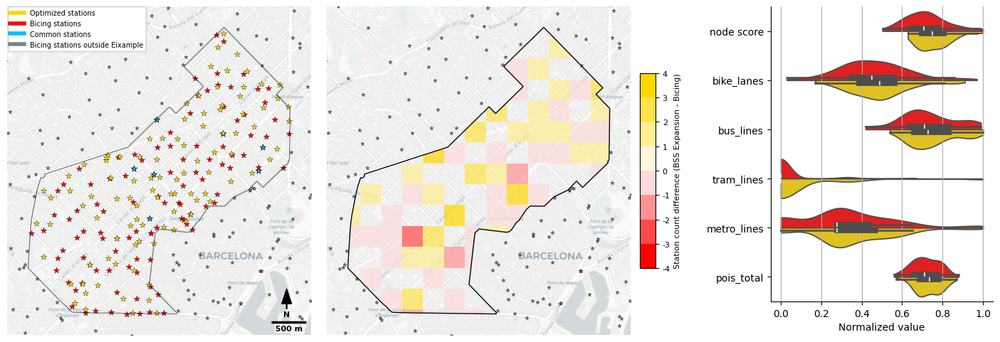

In [ ]:
fig = plt.figure(figsize=(18, 6))
gridx = 10
gridy = 5

# Adjust width_ratios to make colorbar smaller and add space for violin plot
gs = gridspec.GridSpec(
    gridx, gridy, 
    figure=fig, 
    width_ratios=[1, 1, 0.05, 0.35, 0.7],
    wspace=0.01
)

grid_size = 300
max_diff_global = 4
alpha = 0.7

# Create subplots: ax1 (left), ax2 (middle), ax3 (small colorbar), ax4 (right violin plot)
ax1 = fig.add_subplot(gs[:, 0])
ax2 = fig.add_subplot(gs[:, 1])
ax3 = fig.add_subplot(gs[2:-2, 2])  # Only use rows 2 to -2 (middle 60% of height)
ax4 = fig.add_subplot(gs[:-1, 4])     # Add violin plot subplot

eixample_boundary = df_districts[df_districts['district'] == 'Eixample'].geometry.union_all()
eixample_boundary_gdf = gpd.GeoDataFrame(geometry=[eixample_boundary], crs=25831)

# Identify common stations, bicing-only stations and optimized-only stations in Eixample
common_stations_in_eixample = bicing_stations_in_eixample[
    bicing_stations_in_eixample.index.isin(optimized_stations.index)]
bicing_only_in_eixample = bicing_stations_in_eixample[
    ~bicing_stations_in_eixample.index.isin(optimized_stations.index)]
optimized_only_in_eixample = optimized_stations[
    ~optimized_stations.index.isin(bicing_stations_in_eixample.index)]

# Subplot 1: all bicing and optimized stations
bicing_stations_outside_eixample.plot(ax=ax1, color='gray', markersize=15, marker='*', linewidth=0.25, edgecolor='black')
common_stations_in_eixample.plot(ax=ax1, color='deepskyblue', markersize=40, marker='*', linewidth=0.5, edgecolor='black')
bicing_only_in_eixample.plot(ax=ax1, color='red', markersize=40, marker='*', linewidth=0.25, edgecolor='black')
optimized_only_in_eixample.plot(ax=ax1, color='gold', markersize=40, marker='*', linewidth=0.25, edgecolor='black')
eixample_boundary_gdf.boundary.plot(ax=ax1, color='black', linewidth=1, alpha=0.5)
ctx.add_basemap(ax1, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=14, attribution=False)

# Subplot 2: difference count of stations
plot_station_differences(ax2, bicing_stations_in_eixample, optimized_stations, city_boundary, eixample_boundary, grid_size, max_diff_global, alpha=alpha) 
bicing_stations_outside_eixample.overlay(eixample_boundary_gdf, how='difference').plot(
        ax=ax2, color='gray', markersize=15, marker='*', linewidth=0.25, edgecolor='black')
eixample_boundary_gdf.boundary.plot(ax=ax2, color='black', linewidth=1)
ctx.add_basemap(ax2, source=ctx.providers.CartoDB.Positron, crs=city_boundary.crs, zoom=14, attribution=False)

# Subplot 3: colorbar (smaller)
diff_cmap = get_gold_red_cmap(max_diff_global)
create_difference_colorbar(ax3, max_diff_global, diff_cmap)

# Subplot 4: violin plot of station attributes
replace_names = {
    's2': 'node score',
    'bike_lane_kms': 'bike_lanes',
}
combined_data_melted['variable'] = combined_data_melted['variable'].replace(replace_names)
sns.violinplot(data=combined_data_melted, x='value', y='variable', hue='dataset', 
                split=True, palette=['red', 'gold'], cut=0, ax=ax4, density_norm='width',
                order=['node score', 'bike_lanes', 'bus_lines', 'tram_lines', 'metro_lines', 'pois_total'],
                legend=False)
ax4.set_ylabel('')
ax4.set_xlabel('Normalized value')
ax4.grid(axis='x')
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Set xlim and ylim a little bigger than the min/max of eixample_boundary
buffer = 300
minx, miny, maxx, maxy = eixample_boundary.bounds
for ax in [ax1, ax2]:
    ax.set_xlim(minx - buffer, maxx + buffer)
    ax.set_ylim(miny - buffer, maxy + buffer)

# Add north arrow and scale bar to ax1
arrow_fontsize = 8
add_north_arrow(ax1, size=0.06, location=(0.92, 0.14), linewidth=0.7, fontsize=arrow_fontsize)
add_scalebar(ax1, length=500, location=(0.87, 0.04), linewidth=2.5, units='m', fontsize=arrow_fontsize, color='k')

# Add detailed legend to first subplot, matching the example image
linewidth = 4
markersize = 10
legend_elements = [
    Line2D([0], [0], color='gold', label='Optimized stations',
           linewidth=linewidth, marker=None, markersize=markersize),
    Line2D([0], [0], color='red', label='Bicing stations',
           linewidth=linewidth, marker=None, markersize=markersize),
    Line2D([0], [0], color='deepskyblue', label='Common stations',
           linewidth=linewidth, marker=None, markersize=markersize),
    Line2D([0], [0], color='gray', label='Bicing stations outside Eixample',
           linewidth=linewidth, marker=None, markersize=markersize),
]

# Create the legend positioned in the top-left corner of ax1
legend = ax1.legend(handles=legend_elements, loc='upper left', 
                   bbox_to_anchor=(-0.01, 1.01), 
                   frameon=True, 
                   fancybox=False,  # No rounded corners
                   shadow=False,    # No shadow
                   fontsize=7,
                   title=None)
legend.get_frame().set_alpha(1)
legend.set_zorder(1000)

ax1.axis('off')
ax2.axis('off')
plt.tight_layout()
plt.savefig(f'{ROOT}/{VISUALIZATIONS}/BSS_ampliation/bss_comparison.png', dpi=300, bbox_inches='tight')
plt.show()